### load

In [2]:
## input: 1. summarizedExperiement(SE) obj for chromVAR 2. Jaspar matrix 
## output: 1. motif x cell (z score) 2. plot: ranked           
source("./libs.R")

In [3]:
##------------------------------------------------------------
## inputs
##------------------------------------------------------------

input.chromVar.res.list <- readRDS(file = "../dat/output.jaspar.dev.res.Rdata")
input.chromVar.jaspar.z <- assays(input.chromVar.res.list$dev)$z
input.umap.res <- fread("../dat/1908/Islet_123.MNN_corrected.cluster_labels.filt.txt", 
    header = T) %>% separate(cluster, into = c("cell_type_overall", "subtype"), remove = F)
input.chromVar.jaspar.var <- fread("../dat/1908/output.jaspar.var.res.abcd.csv")

Warning message:
“Expected 2 pieces. Missing pieces filled with `NA` in 600 rows [5, 18, 19, 50, 81, 114, 128, 147, 169, 175, 176, 190, 209, 250, 260, 345, 353, 376, 389, 413, ...].”

barcodes,UMAP1,UMAP2,cluster,cell_type_overall,subtype,log10_n_counts,log10_n_peaks,Islet1,Islet2,Islet3
<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<int>
Islet3-fresh_CTGAAGCTTGCAGCTACTCTCTATTATAGCCT,6.029433,-3.429818,beta_2,beta,2,4.520863,4.152013,0,0,1


[1] 14239    11

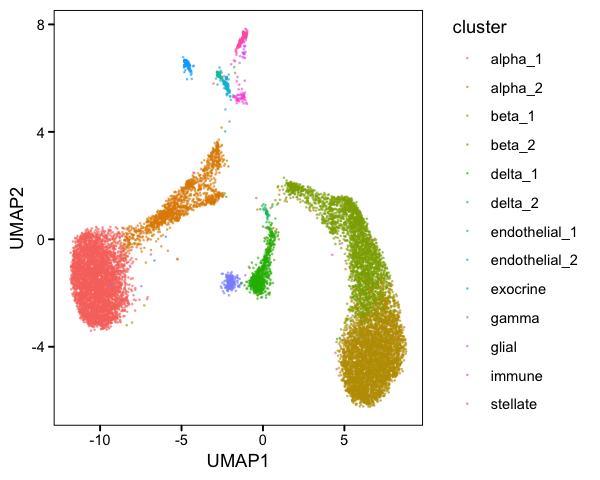

In [4]:
options(repr.plot.width = 5, repr.plot.height = 4)
# filter unkonwn

head(input.umap.res, 1)
dim(input.umap.res)
ggplot(input.umap.res, aes(UMAP1, UMAP2)) + geom_point(aes(color = cluster), size = 0.1, 
    alpha = 0.5) + theme_pubr()

Loading required package: venn



      alpha        beta       delta endothelial    exocrine       gamma 
       5535        7108         709         136         113         205 
      glial      immune    stellate 
         34          58         134 


      alpha        beta       delta endothelial    exocrine       gamma 
       5594        7170         718         157         131         206 
      glial      immune    stellate 
         39          71         153 

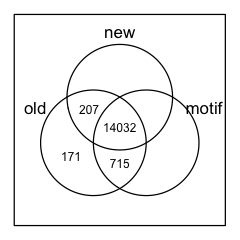

In [5]:
require(venn)
options(repr.plot.width = 2, repr.plot.height = 2)

input.umap.res.old <- fread("../dat/Islet_123.MNN_corrected.UMAP.txt")
input.chromVar.jaspar.z <- assays(input.chromVar.res.list$dev)$z

venn(list(old = input.umap.res.old$barcodes, new = input.umap.res$barcodes, motif = colnames(input.chromVar.jaspar.z)[-1]))
table(input.umap.res %>% filter(barcodes %in% colnames(input.chromVar.jaspar.z)[-1]) %>% 
    pull(cell_type_overall))
table(input.umap.res %>% pull(cell_type_overall))

In [6]:
fun.plot.project.motif <- function(motif, input.chromVar.z = input.chromVar.jaspar.z, 
    umap.res = input.umap.res, rescale = F, cls = rev(cols.sky), bks = c(-4, 0, 4), 
    ...) {
    require(scales)
    
    motif.idx <- grep(motif, rownames(input.chromVar.z))
    if (length(motif.idx) == 0) {
        message(motif, " is not found!")
        return()
    }
    
    motif.z <- input.chromVar.z[motif.idx[1], ]
    if (rescale) {
        sc <- max(abs(quantile(motif.z, probs = c(0.05, 0.95))))
        motif.z[motif.z > sc] <- sc
        motif.z[motif.z < -sc] <- -sc
    }
    
    motif.z <- motif.z %>% as.data.frame() %>% rownames_to_column("barcodes")
    colnames(motif.z)[2] <- "zval"
    
    tmp <- umap.res %>% right_join(motif.z)
    tmp <- tmp %>% mutate(zval = ifelse(zval > bks[3], bks[3], ifelse(zval < bks[1], 
        bks[1], zval)))
    p.default.cluster.motif <- ggplot(tmp, aes(UMAP1, UMAP2)) + geom_point(aes(colour = zval), 
        shape = 16, ...) + ggtitle(rownames(input.chromVar.jaspar.z)[motif.idx]) + 
        scale_color_gradientn(colours = cls, breaks = bks) + theme_pubr() + theme(text = element_blank(), 
        axis.ticks = element_blank(), legend.position = c(0.2, 0.9), legend.direction = "horizontal", 
        legend.key.width = unit(2, "mm"), legend.key.height = unit(0.1, "inches"), 
        legend.text = element_text(size = 10, family = "Arial"), legend.background = element_rect(fill = "transparent", 
            colour = "transparent"), plot.margin = unit(c(1, 1, -1, -1), "mm"))
    
    p.default.cluster.motif
}

Joining, by = "barcodes"
Joining, by = "barcodes"
Joining, by = "barcodes"
Warning message:
“Removed 715 rows containing missing values (geom_point).”Warning message:
“Removed 715 rows containing missing values (geom_point).”Warning message:
“Removed 715 rows containing missing values (geom_point).”

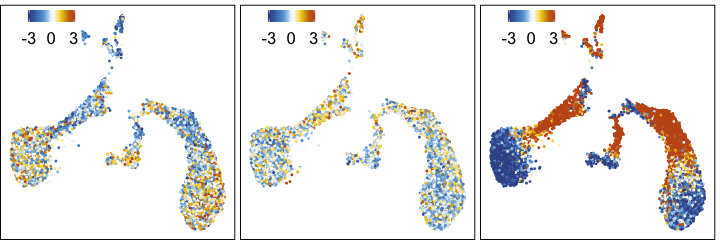

In [7]:
options(repr.plot.width = 6, repr.plot.height = 2)

ps <- lapply(c("RFX3", "XBP1", "FOS::JUN"), fun.plot.project.motif, bks = c(-3, 0, 
    3), size = 0.5)
names(ps) <- c("RFX3", "XBP1", "FOS::JUN")
ggarrange(plotlist = ps, ncol = 3)

Joining, by = "barcodes"
Joining, by = "barcodes"
Joining, by = "barcodes"
Warning message:
“Removed 715 rows containing missing values (geom_point).”Warning message:
“Removed 715 rows containing missing values (geom_point).”Warning message:
“Removed 715 rows containing missing values (geom_point).”

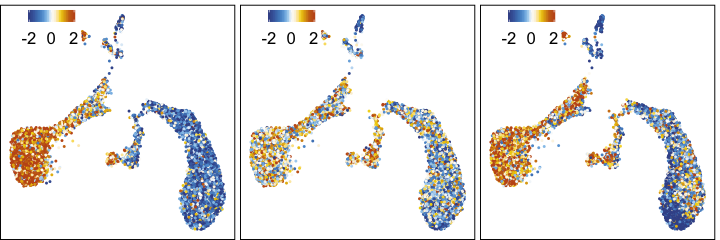

In [8]:
plt.motifs <- c("GATA3", "SCRT1", "HNF1B")
options(repr.plot.width = 6, repr.plot.height = 2)

ps <- lapply(plt.motifs, fun.plot.project.motif, bks = c(-2, 0, 
    2), size = 0.5)
names(ps) <- plt.motifs
ggarrange(plotlist = ps, ncol = 3)

In [16]:
table(input.umap.res%>%pull(cluster))


      alpha_1       alpha_2        beta_1        beta_2       delta_1 
         4266          1328          4354          2816           683 
      delta_2 endothelial_1 endothelial_2      exocrine         gamma 
           35            62            95           131           206 
        glial        immune      stellate 
           39            71           153 

### cell-type specific motif between beta and delta

Joining, by = "barcodes"
Joining, by = "barcodes"
Warning message:
“Removed 715 rows containing missing values (geom_point).”Warning message:
“Removed 715 rows containing missing values (geom_point).”

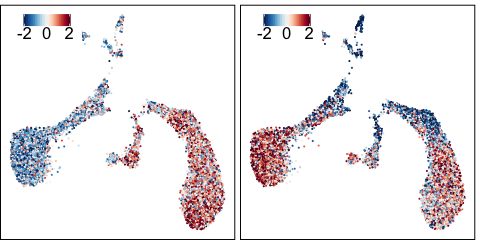

In [100]:
options(repr.plot.width = 4, repr.plot.height = 2)

ps <- lapply(c("PDX1", "FOXA1"), fun.plot.project.motif, bks = c(-2, 0, 
    2),size=.25)
names(ps) <- c("PDX1", "FOXA1")
ggarrange(plotlist = ps, ncol = 2)

In [19]:
input.umap.res[is.na(input.umap.res)] <- 0

###  T test (one vs. other)

In [93]:
input.chromVar.jaspar.z <- data.table(assays(input.chromVar.res.list$dev)$z, keep.rownames = T)

# aggregate data --------------------------------------------------------------
# melt
input.chromVar.jaspar.z.agg <- melt(input.chromVar.jaspar.z, id = "rn", variable.name = "barcodes", 
    value.name = "zval")

# add celltype
input.chromVar.jaspar.z.agg <- merge(input.chromVar.jaspar.z.agg, input.umap.res)

table(input.chromVar.jaspar.z.agg%>%pull(cell_type_overall))


      alpha        beta       delta endothelial    exocrine       gamma 
    2136510     2744074      273674       52496       43618       79130 
      glial      immune    stellate 
      13124       22388       51724 

In [102]:
input.chromVar.jaspar.z.agg%>%head(1)

barcodes,rn,zval,UMAP1,UMAP2,cluster,cell_type_overall,log10_n_counts,log10_n_peaks,Islet1,Islet2,Islet3
Islet1-fresh_AGACACCTAAGAGGCAAAGGAGTACCTAT,MA0025.1_NFIL3,-0.3430543,6.975175,-3.232226,beta_1,beta,3.694693,3.384174,1,0,0


In [101]:
input.chromVar.jaspar.z.agg<- input.chromVar.jaspar.z.agg%>%unite(rn,id,name,sep = '_')

In [94]:
input.chromVar.jaspar.z.agg <- input.chromVar.jaspar.z.agg %>% separate(rn, into = c("id", 
    "name"), sep = "_")%>% select(-subtype)
range(input.chromVar.jaspar.z.agg$zval)
sum(!complete.cases(input.chromVar.jaspar.z.agg))
dim(input.chromVar.jaspar.z.agg)
head(input.chromVar.jaspar.z.agg, 1)
table(input.chromVar.jaspar.z.agg %>% pull(cell_type_overall))

[1] -17.90770  35.45968

[1] 5416738      14

barcodes,id,name,zval,UMAP1,UMAP2,cluster,cell_type_overall,subtype,log10_n_counts,log10_n_peaks,Islet1,Islet2,Islet3
Islet1-fresh_AGACACCTAAGAGGCAAAGGAGTACCTAT,MA0025.1,NFIL3,-0.3430543,6.975175,-3.232226,beta_1,beta,1,3.694693,3.384174,1,0,0



      alpha        beta       delta endothelial    exocrine       gamma 
    2136510     2744074      273674       52496       43618       79130 
      glial      immune    stellate 
      13124       22388       51724 

In [99]:
(celltype.test.all<- input.chromVar.jaspar.z.agg%>%pull(cell_type_overall)%>%unique())
test.motifs <- input.chromVar.jaspar.z.agg%>%pull(name)%>%unique()
length(test.motifs)
input.chromVar.jaspar.z.agg <- input.chromVar.jaspar.z.agg%>%select()

[1] "beta"        "alpha"       "immune"      "delta"       "exocrine"   
[6] "gamma"       "glial"       "stellate"    "endothelial"

[1] 386

In [ ]:
require(parallel)
celltype.test.all <- list(alpha_vs_gamma = c("alpha", "gamma"), beta_vs_delta = c("beta", 
    "delta"))
ttest.res.ct <- do.call(rbind, lapply(celltype.test.all, function(ntest) {
    
    celltype.test <- c(ntest, "other")
    ttest.res <- do.call(rbind, mclapply(test.motifs, function(motif) {
        pd <- input.chromVar.jaspar.z.agg %>% filter(name == motif, cell_type_overall %in% 
            celltype.test)
        test.res <- t.test(pd %>% filter(cell_type_overall == celltype.test[1]) %>% 
            select(zval), pd %>% filter(cell_type_overall == celltype.test[2]) %>% 
            select(zval))
        (data.frame(motif = motif, mean_x = test.res$estimate[1], mean_y = test.res$estimate[2], 
            pval = test.res$p.value/2))
    }, mc.cores = 10)) %>% mutate(test = ntest)
})) %>% group_by(test) %>% mutate(FDR = p.adjust(pval, "BH"), padj = p.adjust(pval, 
    "bonferroni"))
head(ttest.res.ct, 1)

### T Tests (a_v_g,b_v_d)

In [182]:
input.chromVar.jaspar.z <- data.table(assays(input.chromVar.res.list$dev)$z,keep.rownames = T)
class(input.chromVar.jaspar.z)
head(rownames(input.chromVar.jaspar.z))

[1] "data.table" "data.frame"

[1] "1" "2" "3" "4" "5" "6"

In [183]:
# aggregate data --------------------------------------------------------------
# melt
input.chromVar.jaspar.z.agg <- melt(input.chromVar.jaspar.z, id = "rn", variable.name = "barcodes", 
    value.name = "zval")

# add celltype
input.chromVar.jaspar.z.agg <- merge(input.chromVar.jaspar.z.agg, input.umap.res) 


head(input.chromVar.jaspar.z.agg,1)
dim(input.chromVar.jaspar.z.agg)
dim(input.chromVar.jaspar.z)
table(input.chromVar.jaspar.z.agg%>%pull(cell_type_overall))

barcodes,rn,zval,UMAP1,UMAP2,cluster,cell_type_overall,subtype,log10_n_counts,log10_n_peaks,Islet1,Islet2,Islet3
Islet1-fresh_AGACACCTAAGAGGCAAAGGAGTACCTAT,MA0025.1_NFIL3,-0.3430543,6.975175,-3.232226,beta_1,beta,1,3.694693,3.384174,1,0,0


[1] 5416738      13

[1]   386 14749


      alpha        beta       delta endothelial    exocrine       gamma 
    2136510     2744074      273674       52496       43618       79130 
      glial      immune    stellate 
      13124       22388       51724 

In [184]:
input.chromVar.jaspar.z.agg <- input.chromVar.jaspar.z.agg[complete.cases(input.chromVar.jaspar.z.agg), 
   ] %>% separate(rn, into = c("id", "name"), sep = "_")
range(input.chromVar.jaspar.z.agg$zval)
dim(input.chromVar.jaspar.z.agg)
head(input.chromVar.jaspar.z.agg,1)

[1] -17.90770  33.67385

[1] 5206754      14

barcodes,id,name,zval,UMAP1,UMAP2,cluster,cell_type_overall,subtype,log10_n_counts,log10_n_peaks,Islet1,Islet2,Islet3
Islet1-fresh_AGACACCTAAGAGGCAAAGGAGTACCTAT,MA0025.1,NFIL3,-0.3430543,6.975175,-3.232226,beta_1,beta,1,3.694693,3.384174,1,0,0


In [82]:
motif ='NFIL3'
table(input.chromVar.jaspar.z.agg %>% filter(name == motif)%>%pull(cell_type_overall))
table(input.chromVar.jaspar.z.agg%>%pull(cell_type_overall))


      alpha        beta       delta endothelial 
       5535        7109         709         136 


      alpha        beta       delta endothelial 
    2136510     2744074      273674       52496 

In [202]:
require(parallel)
celltype.test.all <- list(alpha_vs_gamma = c("alpha", "gamma"), beta_vs_delta = c("beta", 
    "delta"))
ttest.res <- do.call(rbind, lapply(names(celltype.test.all), function(ntest) {
    # cells <- c('beta', 'delta')
    celltype.test <- celltype.test.all[[ntest]]
    test.motifs <- input.chromVar.jaspar.z.agg %>% filter(cell_type_overall %in% 
        celltype.test) %>% pull(name) %>% unique
    ttest.res <- do.call(rbind, mclapply(test.motifs, function(motif) {
        pd <- input.chromVar.jaspar.z.agg %>% filter(name == motif, cell_type_overall %in% 
            celltype.test)
        test.res <- t.test(pd %>% filter(cell_type_overall == celltype.test[1]) %>% 
            select(zval), pd %>% filter(cell_type_overall == celltype.test[2]) %>% 
            select(zval))
        (data.frame(`motif` = motif, mean_x = test.res$estimate[1], mean_y = test.res$estimate[2], 
            pval = test.res$p.value/2))
    }, mc.cores = 10)) %>% mutate(test = ntest)
}))
head(ttest.res,1)
head(ttest.res%>%filter(test=='beta_vs_delta'),1)

motif,mean_x,mean_y,pval,test
NFIL3,-0.2479951,0.05709858,3.703684e-05,alpha_vs_gamma


motif,mean_x,mean_y,pval,test
NFIL3,0.203819,0.0655054,0.0009128493,beta_vs_delta


In [333]:
ttest.res <- ttest.res %>% group_by(test) %>% mutate(FDR = p.adjust(pval, "BH"), 
    padj = p.adjust(pval, "bonferroni"))

In [387]:
fwrite(ttest.res, "~/Dropbox (UCSD_Epigenomics)/workReports/2019-08-27_islet/chromVar_ttest_res.csv")

In [6]:
# head(ttest.res,1)
ttest.res <- fread("~/Dropbox (UCSD_Epigenomics)/workReports/2019-08-27_islet/chromVar_ttest_res.csv") %>% 
    rowid_to_column("rank") %>% mutate(rank = ifelse(rank > 386, rank - 386, rank))
head(ttest.res, 1)

rank,motif,mean_x,mean_y,pval,test,x,y,enriched,FDR,padj
1,MAFG,0.4259281,-2.01688,1.42e-74,alpha_vs_gamma,alpha,gamma,alpha,5.4812e-72,5.4812e-72


In [379]:
head(input.chromVar.jaspar.z.agg,1)

barcodes,id,name,zval,UMAP1,UMAP2,cluster,cell_type_overall,subtype,log10_n_counts,log10_n_peaks,Islet1,Islet2,Islet3
Islet1-fresh_AGACACCTAAGAGGCAAAGGAGTACCTAT,MA0025.1,NFIL3,-0.3430543,6.975175,-3.232226,beta_1,beta,1,3.694693,3.384174,1,0,0


In [97]:
head(ttest.res, 1)

rank,motif,mean_x,mean_y,pval,test,x,y,enriched,FDR,padj,diff,id
1,MAFG,0.4259281,-2.01688,1.42e-74,alpha_vs_gamma,alpha,gamma,alpha,5.4812e-72,5.4812e-72,2.442808,MA0659.1


In [386]:
ttest.res<- (ttest.res %>% left_join(input.chromVar.jaspar.z.agg %>% select(name, id) %>% 
    unique, by = c(motif = "name")))
dim(ttest.res)

[1] 772  13

### Motif db

#### manipulate data 

In [16]:
ttest.res <- fread("~/Dropbox (UCSD_Epigenomics)/workReports/2019-08-27_islet/chromVar_ttest_res.csv")
head(ttest.res,1)

rank,motif,mean_x,mean_y,pval,test,x,y,enriched,FDR,padj,diff,id
1,MAFG,0.4259281,-2.01688,1.42e-74,alpha_vs_gamma,alpha,gamma,alpha,5.4812e-72,5.4812e-72,2.442808,MA0659.1


In [17]:
tfclass.db.dic <- readRDS("~/github/atacMotif/db/dic_jaspar_tfclass.rds")
tfclass.db <- readRDS('~/github/atacMotif/db/tfclass.rds')
#str(tfclass.db)

#### mannual visualization

In [20]:
dim(ttest.res)
ttest.res.2 <- (ttest.res %>% left_join(tfclass.db.dic$merged %>% select(jaspar.id, 
    family.id, family.name), by = c(id = "jaspar.id")) %>% unique())
ttest.res.2 %>% head(1)


ttest.res.motifdb <- (ttest.res.2 %>% filter(FDR < 0.01) %>% ungroup %>% select(family.id, 
    family.name) %>% drop_na) %>% unique %>% mutate(class.id = sub(".[0-9]+$", "", 
    family.id), superclass.id = sub(".[0-9]+.[0-9]+$", "", family.id)) %>% left_join(tfclass.db$class, 
    by = c(class.id = "id")) %>% left_join(tfclass.db$superclass, by = c(superclass.id = "id")) %>% 
    select(-starts_with("about")) %>% dplyr::rename(class.name = name.x, superclass.name = name.y)
ttest.res.motifdb %>% head(1)

## number of super family
(n.sc <- ttest.res.motifdb %>% pull(superclass.id) %>% unique %>% length)

[1] 772  13

rank,motif,mean_x,mean_y,pval,test,x,y,enriched,FDR,padj,diff,id,family.id,family.name
1,MAFG,0.4259281,-2.01688,1.42e-74,alpha_vs_gamma,alpha,gamma,alpha,5.4812e-72,5.4812e-72,2.442808,MA0659.1,NA,NA


family.id,family.name,class.id,superclass.id,class.name,superclass.name
1.1.3,Maf-related,1.1,1,Basic leucine zipper factors (bZIP),Basic domains


[1] 7

In [21]:
fun.plot <- function(n = n.sc, labs = 1:n.sc, col.input = col.sc, ...) {
    plot(c(0, 1), c(0, 1), type = "n", xlab = "", ylab = "", bty = "n", xaxt = "n", 
        yaxt = "n", ...)
    edgs <- seq(0, 1, length.out = n + 1)
    delta <- edgs[2] - edgs[1]
    i <- 1:n
    axis(1, at = edgs[-1] - delta/2, labels = labs, las = 2, lwd = 0, lwd.ticks = 1)
    rect(edgs[i], 0, edgs[i + 1], 1, col = col.input)
}


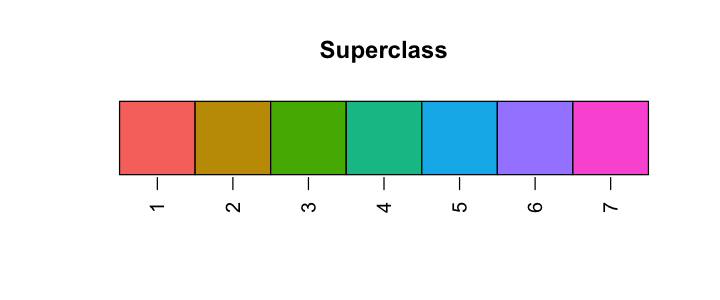

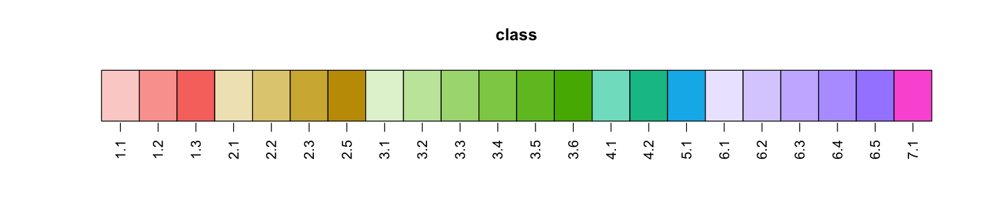

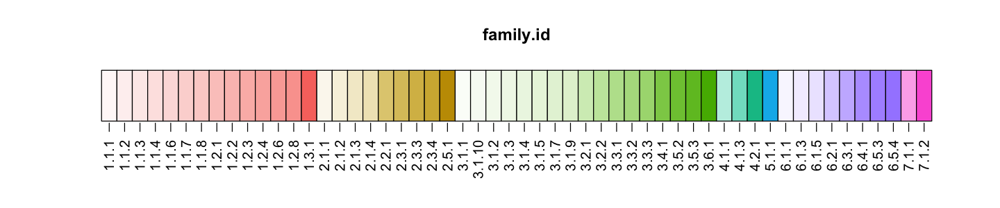

In [22]:
require(scales)

options(repr.plot.width = 6, repr.plot.height = 2.5)
fun.plot_all <- function(col.sc = hue_pal()(7)) {
    fun.plot(main = "Superclass", col.input = col.sc)
    
    pd.tmp <- ttest.res.motifdb %>% select(class.id, superclass.id) %>% unique %>% 
        pull(superclass.id) %>% table
    col.c <- unlist(lapply(names(pd.tmp), function(i) {
        ii = as.numeric(i)
        tmp.cols <- colorRampPalette(c("white", col.sc[ii]))(pd.tmp[i] %>% as.numeric + 
            1)
        tmp.cols[-1]
    }))
    
    
    fun.plot(n = length(col.c), col.input = col.c, labs = ttest.res.motifdb %>% arrange(class.id) %>% 
        pull(class.id) %>% unique, main = "class")
    
    pd.tmp <- ttest.res.motifdb %>% select(family.id, class.id) %>% unique %>% pull(class.id) %>% 
        table
    names(col.c) <- names(pd.tmp)
    col.f <- unlist(lapply(names(pd.tmp), function(i) {
        n.pre <- as.character(as.numeric(i) - 0.1)
        c.start = ifelse(n.pre %in% names(pd.tmp), col.c[n.pre], "white")
        tmp.cols <- colorRampPalette(c(c.start, col.c[i]))(pd.tmp[i] %>% as.numeric + 
            1)
        tmp.cols[-1]
    }))
    names(col.f) <- ttest.res.motifdb %>% arrange(family.id) %>% pull(family.id) %>% 
        unique
    options(repr.plot.width = 12, repr.plot.height = 2.5)
    fun.plot(n = length(col.f), col.input = col.f, labs = names(col.f), main = "family.id", 
        cex = 0.5)
    col.f
}
tmp<- fun.plot_all()

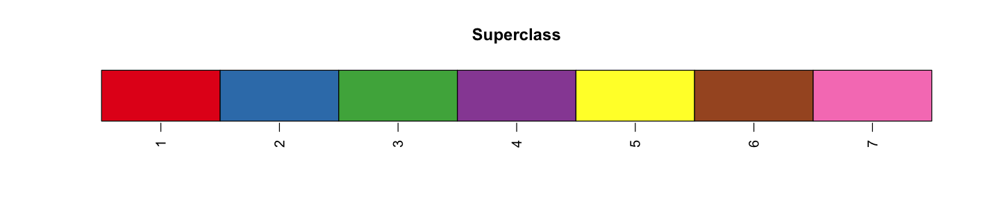

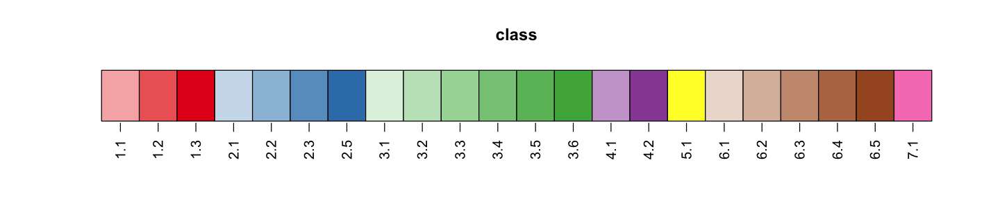

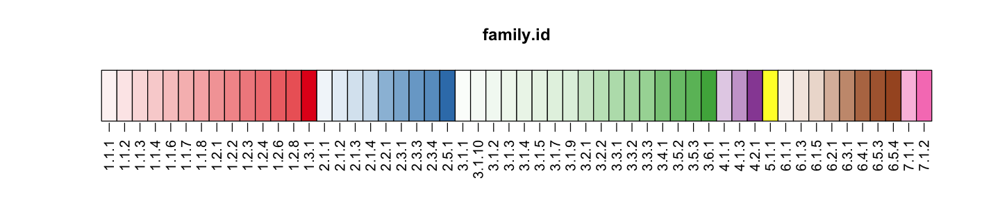

In [23]:
col.f <- fun.plot_all(brewer.pal(n = n.sc+1,name = "Set1")[c(1:4,6:8)])

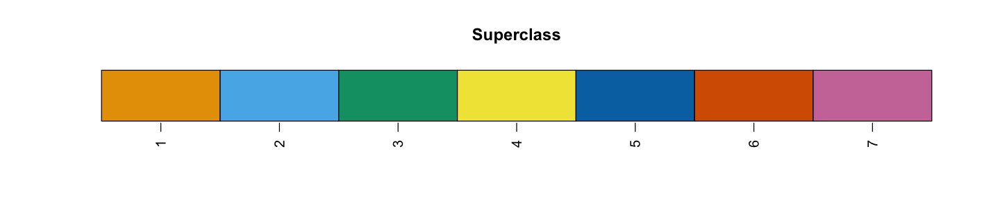

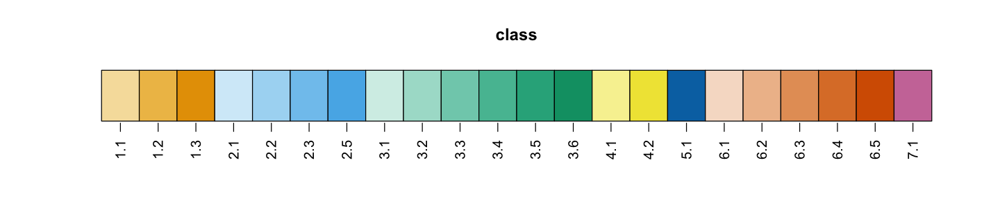

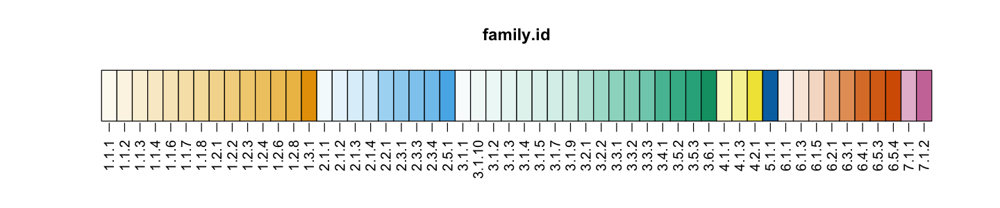

In [24]:
tmp<- fun.plot_all(colorblind_pal()(1+n.sc)[-1])

saveRDS(col.f,'../figcode/col.f.rds')

#### ggraph visual

In [7]:
d1%>%head(1)
d2%>%head(1)
edges%>% head(1)
vertices%>%head(2)

from,to
origin,group1


from,to
group1,subgroup_1


from,to
origin,group1


name,value,group,id,angle,hjust
origin,0.5279515,NA,NA,NA,NA
group1,0.1926846,origin,NA,NA,NA


Warning message:
“Removed 1 rows containing missing values (geom_point).”

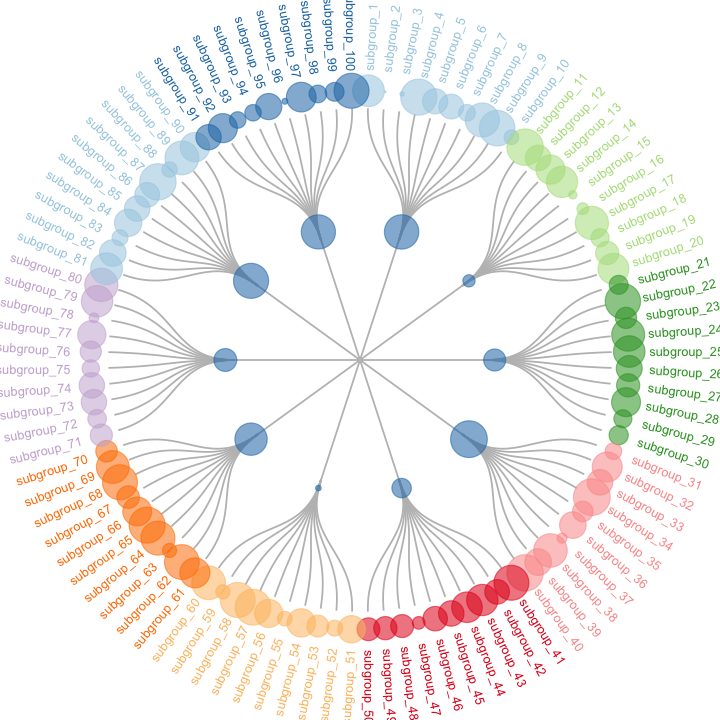

In [29]:
    options(repr.plot.width = 6, repr.plot.height = 6)

require(ggraph)
require(igraph)
require(tidyverse)
require(RColorBrewer) 
# create a data frame giving the hierarchical structure of your individuals
d1=data.frame(from="origin", to=paste("group", seq(1,10), sep=""))
d2=data.frame(from=rep(d1$to, each=10), to=paste("subgroup", seq(1,100), sep="_"))
edges=rbind(d1, d2)
 
# create a vertices data.frame. One line per object of our hierarchy
vertices = data.frame(
  name = unique(c(as.character(edges$from), as.character(edges$to))) , 
  value = runif(111)
) 
# Let's add a column with the group of each name. It will be useful later to color points
vertices$group = edges$from[ match( vertices$name, edges$to ) ]
 
 
#Let's add information concerning the label we are going to add: angle, horizontal adjustement and potential flip
#calculate the ANGLE of the labels
vertices$id=NA
myleaves=which(is.na( match(vertices$name, edges$from) ))
nleaves=length(myleaves)
vertices$id[ myleaves ] = seq(1:nleaves)
vertices$angle= 90 - 360 * vertices$id / nleaves
 
# calculate the alignment of labels: right or left
# If I am on the left part of the plot, my labels have currently an angle < -90
vertices$hjust<-ifelse( vertices$angle < -90, 1, 0)
 
# flip angle BY to make them readable
vertices$angle<-ifelse(vertices$angle < -90, vertices$angle+180, vertices$angle)
 
# Create a graph object
mygraph <- graph_from_data_frame( edges, vertices=vertices )
 
# Make the plot
ggraph(mygraph, layout = 'dendrogram', circular = TRUE) + 
  geom_edge_diagonal(colour="grey") +
  scale_edge_colour_distiller(palette = "RdPu") +
  geom_node_text(aes(x = x*1.15, y=y*1.15, filter = leaf, label=name, angle = angle, hjust=hjust, colour=group), size=2.7, alpha=1) +
  geom_node_point(aes( x = x*1.07, y=y*1.07, colour=group, size=value, alpha=0.2)) +
  scale_colour_manual(values= rep( brewer.pal(9,"Paired") , 30)) +
  scale_size_continuous( range = c(0.1,10) ) +
  theme_void() +
  theme(
    legend.position="none",
    plot.margin=unit(c(0,0,0,0),"cm"),
  ) +
  expand_limits(x = c(-1.3, 1.3), y = c(-1.3, 1.3))

In [44]:
hierarchy

# A tbl_graph: 299 nodes and 298 edges
#
# A rooted tree
#
# Node Data: 299 x 5 (active)
  height leaf  label members Class 
   <dbl> <lgl> <fct>   <int> <chr> 
1  0     TRUE  108         1 setosa
2  0     TRUE  131         1 setosa
3  0.265 FALSE ""          2 setosa
4  0     TRUE  103         1 setosa
5  0     TRUE  126         1 setosa
6  0     TRUE  130         1 setosa
# … with 293 more rows
#
# Edge Data: 298 x 2
   from    to
  <int> <int>
1     3     1
2     3     2
3     7     5
# … with 295 more rows

In [45]:
hairball

# A tbl_graph: 70 nodes and 506 edges
#
# A directed multigraph with 1 component
#
# Edge Data: 506 x 3 (active)
   from    to year 
  <int> <int> <chr>
1     1    13 1957 
2     1    14 1957 
3     1    20 1957 
4     1    52 1957 
5     1    53 1957 
6     2    20 1957 
# … with 500 more rows
#
# Node Data: 70 x 4
  name  year_pop  pop_devel popularity
  <chr> <list>    <chr>          <dbl>
1 1     <table>   increased          3
2 2     <int [0]> unchanged          0
3 3     <int [0]> unchanged          0
# … with 67 more rows

In [2]:
require(ggraph)
require(tidygraph)
require(purrr)
require(rlang)

set_graph_style(plot_margin = margin(1,1,1,1))
hierarchy <- as_tbl_graph(hclust(dist(iris[, 1:4]))) %>% 
  mutate(Class = map_bfs_back_chr(node_is_root(), .f = function(node, path, ...) {
    if (leaf[node]) {
      as.character(iris$Species[as.integer(label[node])])
    } else {
      species <- unique(unlist(path$result))
      if (length(species) == 1) {
        species
      } else {
        NA_character_
      }
    }
  }))

hairball <- as_tbl_graph(highschool) %>% 
  mutate(
    year_pop = map_local(mode = 'in', .f = function(neighborhood, ...) {
      neighborhood %E>% pull(year) %>% table() %>% sort(decreasing = TRUE)
    }),
    pop_devel = map_chr(year_pop, function(pop) {
      if (length(pop) == 0 || length(unique(pop)) == 1) return('unchanged')
      switch(names(pop)[which.max(pop)],
             '1957' = 'decreased',
             '1958' = 'increased')
    }),
    popularity = map_dbl(year_pop, ~ .[1]) %|% 0
  ) %>% 
  activate(edges) %>% 
  mutate(year = as.character(year))

In [ ]:
ggraph(mygraph, layout = 'dendrogram', circular = TRUE) + 
  geom_edge_diagonal(colour="grey") +
  scale_edge_colour_distiller(palette = "RdPu") +
  geom_node_text(aes(x = x*1.15, y=y*1.15, filter = leaf, label=name, angle = angle, hjust=hjust, colour=group), size=2.7, alpha=1) +
  geom_node_point(aes( x = x*1.07, y=y*1.07, colour=group, size=value, alpha=0.2)) +
  scale_colour_manual(values= rep( brewer.pal(9,"Paired") , 30)) +
  scale_size_continuous( range = c(0.1,10) ) +
  theme_void() +
  theme(
    legend.position="none",
    plot.margin=unit(c(0,0,0,0),"cm"),
  ) +
  expand_limits(x = c(-1.3, 1.3), y = c(-1.3, 1.3))

In [20]:
dt.tmp%>%as_tbl_graph

ERROR: Error in data.tree::as.igraph.Node(x, directed = directed, direction = direction, : Node names must be unique within the tree


In [11]:
dendrogram%>% as_tbl_graph

# A tbl_graph: 299 nodes and 298 edges
#
# A rooted tree
#
# Node Data: 299 x 4 (active)
  height leaf  label members
   <dbl> <lgl> <fct>   <int>
1  0     TRUE  108         1
2  0     TRUE  131         1
3  0.265 FALSE ""          2
4  0     TRUE  103         1
5  0     TRUE  126         1
6  0     TRUE  130         1
# … with 293 more rows
#
# Edge Data: 298 x 2
   from    to
  <int> <int>
1     3     1
2     3     2
3     7     5
# … with 295 more rows

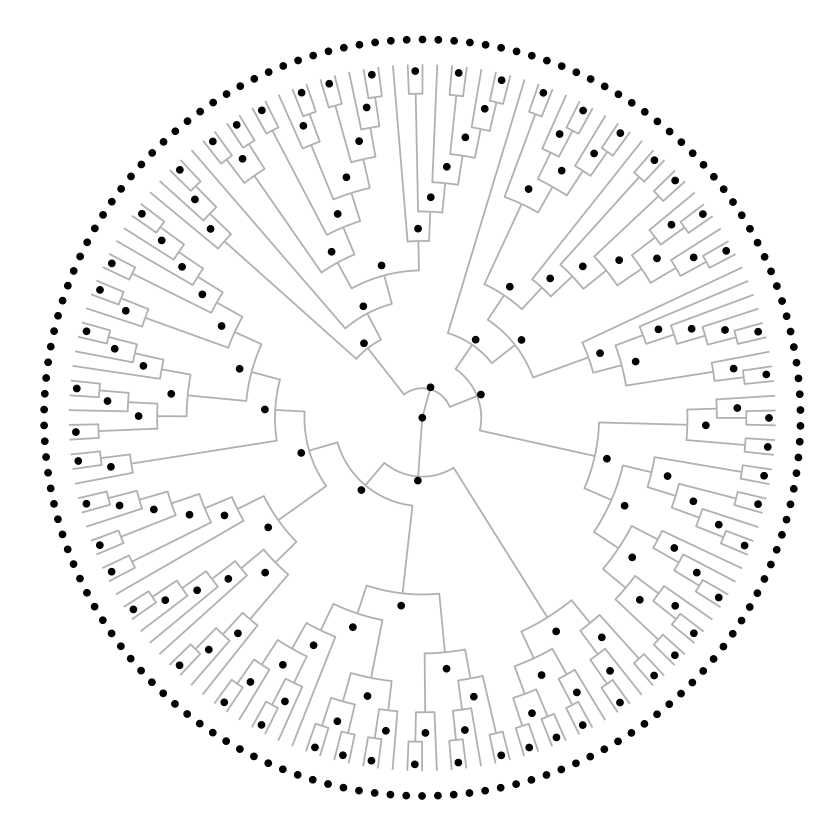

In [12]:
dendrogram <- hclust(dist(iris[, 1:4]))
ggraph(dendrogram%>% as_tbl_graph, "dendrogram", circular = TRUE) + geom_edge_elbow(colour = "grey") + 
    scale_edge_colour_distiller(palette = "RdPu") + geom_node_point(aes(x = x * 1.07, 
    y = y * 1.07)) + coord_fixed()

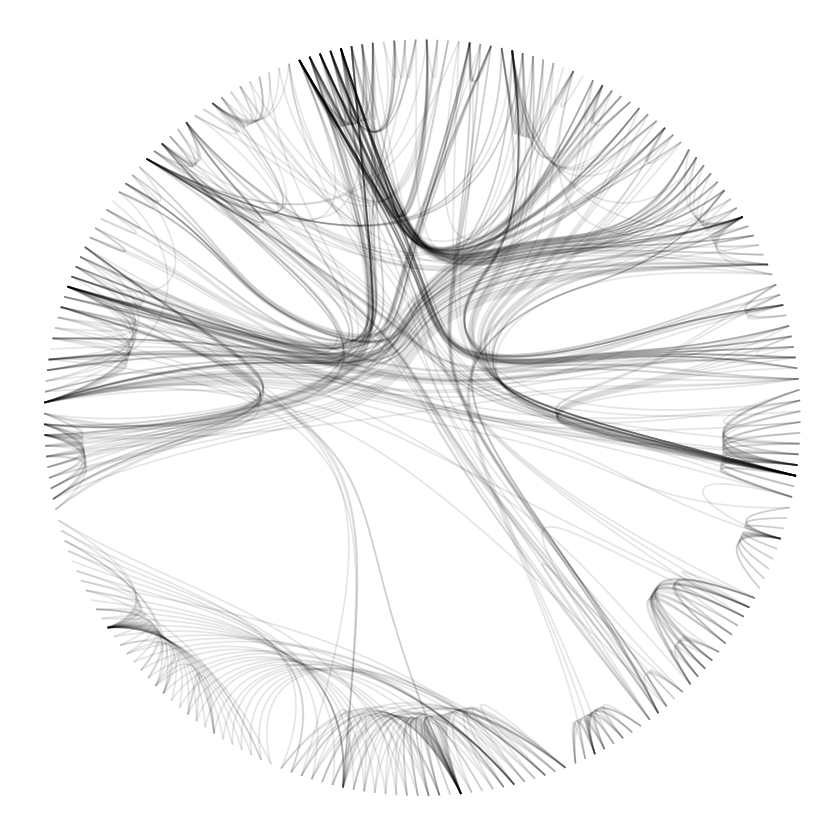

In [3]:
flaregraph <- tbl_graph(flare$vertices, flare$edges)
from <- match(flare$imports$from, flare$vertices$name)
to <- match(flare$imports$to, flare$vertices$name)
ggraph(flaregraph, layout = 'dendrogram', circular = TRUE) + 
  geom_conn_bundle(data = get_con(from = from, to = to), alpha = 0.1) + 
  coord_fixed()

#### data.tree based visualization

In [18]:
dim(ttest.res)
ttest.res.2 <- (ttest.res %>% left_join(tfclass.db.dic$merged %>% select(jaspar.id, family.id, 
    family.name), by = c(id = "jaspar.id"))%>%unique())
ttest.res.2%>%head(1)


ttest.res.motifdb <- (ttest.res.2 %>% filter(FDR < 0.01) %>% ungroup %>% select(family.id, family.name) %>% 
    drop_na)%>%unique%>%mutate(family.id=paste0('0.',family.id))

[1] 772  13

rank,motif,mean_x,mean_y,pval,test,x,y,enriched,FDR,padj,diff,id,family.id,family.name
1,MAFG,0.4259281,-2.01688,1.42e-74,alpha_vs_gamma,alpha,gamma,alpha,5.4812e-72,5.4812e-72,2.442808,MA0659.1,NA,NA


In [22]:
df%>%head(1)

family.id,family.name
0.1.1.3,Maf-related


In [19]:
require(data.tree)
df <- (ttest.res.2 %>% filter(FDR < 0.01) %>% ungroup %>% select(family.id, family.name) %>% 
    drop_na)%>%unique%>%mutate(family.id=paste0('0.',family.id))
#df<- (df %>% separate(family.id, into = c("l1", "l2", "l3"), remove = F, sep = "[.]") %>% 
#    unite(l2, 2:3, remove = F, sep = "."))%>%select(-l3)
#tmp <-head(df,10)
dt.tmp <- FromDataFrameTable(df,pathName = 'family.id',pathDelimiter = '.',colLevels = c('f','ff','fff'))
dt.tmp

Loading required package: data.tree

Attaching package: ‘data.tree’

The following object is masked from ‘package:Biobase’:

    Aggregate



        levelName
1  0             
2   ¦--1         
3   ¦   ¦--1     
4   ¦   ¦   ¦--3 
5   ¦   ¦   ¦--1 
6   ¦   ¦   ¦--2 
7   ¦   ¦   ¦--4 
8   ¦   ¦   ¦--6 
9   ¦   ¦   ¦--7 
10  ¦   ¦   °--8 
11  ¦   ¦--2     
12  ¦   ¦   ¦--3 
13  ¦   ¦   ¦--6 
14  ¦   ¦   ¦--4 
15  ¦   ¦   ¦--1 
16  ¦   ¦   ¦--8 
17  ¦   ¦   °--2 
18  ¦   °--3     
19  ¦       °--1 
20  ¦--3         
21  ¦   ¦--1     
22  ¦   ¦   ¦--4 
23  ¦   ¦   ¦--10
24  ¦   ¦   ¦--2 
25  ¦   ¦   ¦--9 
26  ¦   ¦   ¦--1 
27  ¦   ¦   ¦--7 
28  ¦   ¦   ¦--3 
29  ¦   ¦   °--5 
30  ¦   ¦--3     
31  ¦   ¦   ¦--1 
32  ¦   ¦   ¦--2 
33  ¦   ¦   °--3 
34  ¦   ¦--2     
35  ¦   ¦   ¦--2 
36  ¦   ¦   °--1 
37  ¦   ¦--6     
38  ¦   ¦   °--1 
39  ¦   ¦--4     
40  ¦   ¦   °--1 
41  ¦   °--5     
42  ¦       ¦--2 
43  ¦       °--3 
44  ¦--2         
45  ¦   ¦--3     
46  ¦   ¦   ¦--1 
47  ¦   ¦   ¦--3 
48  ¦   ¦   °--4 
49  ¦   ¦--5     
50  ¦   ¦   °--1 
51  ¦   ¦--1     
52  ¦   ¦   ¦--4 
53  ¦   ¦   ¦--3 
54  ¦   ¦   ¦--2 
55  ¦   ¦ 

In [520]:
df%>%filter(grepl("^1.2",family.id))

family.id,family.name
1.2.3,Tal-related
1.2.6,bHLH-ZIP
1.2.4,Hairy-related
1.2.1,E2A
1.2.8,HLH only
1.2.2,MyoD-ASC-related


In [33]:
plot(dt.tmp)

HTML widgets cannot be represented in plain text (need html)

In [508]:
class(dt.tmp)
class(acme)

[1] "Node" "R6"

[1] "Node" "R6"

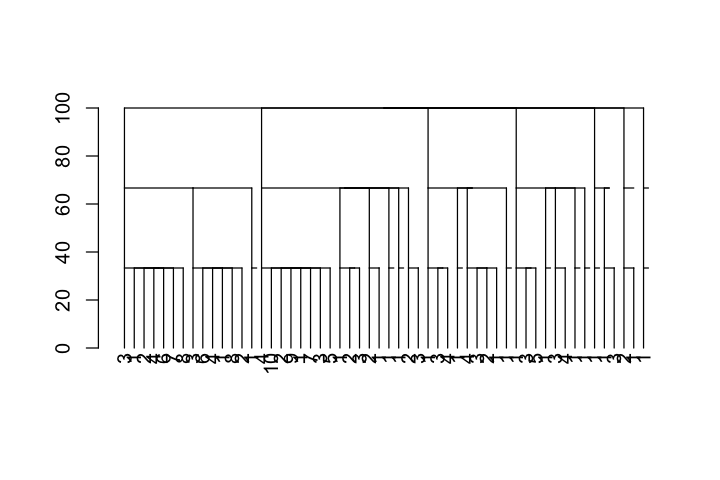

In [529]:
options(repr.plot.width = 6, repr.plot.height = 4)

plot(as.dendrogram(dt.tmp),cex=.5)

In [503]:
plot(acme)

HTML widgets cannot be represented in plain text (need html)

In [501]:
plot(dt.tmp)

HTML widgets cannot be represented in plain text (need html)

In [496]:
length(dt.tmp)

[1] 46

In [514]:
tmp.dup <- ttest.res.2 %>% group_by(test) %>% filter(duplicated(motif))
#ttest.res.2 %>% filter(motif %in% tmp.dup$motif)

In [400]:
sum(!ttest.res$id %in% tfclass.db.dic$jasparTOtfclass$jaspar.id)
sum(!ttest.res$id %in% tfclass.db.dic$merged$jaspar.id)
remain.motif <- ttest.res[!ttest.res$id %in% tfclass.db.dic$merged$jaspar.id,c('motif','id')]%>%unique
sum(remain.motif$motif %in% tfclass.db.dic$merged$genus.name)
remain.motif[!(remain.motif$motif %in% tfclass.db.dic$merged$genus.name),]

[1] 50

[1] 34

[1] 14

motif,id
FOS::JUN,MA0099.2
NFYA,MA0060.2
NFIC,MA0161.1


In [360]:
rm(input.pseudotime)

### plots - ranked bars

In [2]:
#require(devtools)
#install_github("jokergoo/ComplexHeatmap")
require(ComplexHeatmap)

In [331]:
ttest.res <- ttest.res %>% mutate(padj.1 = ifelse(enriched %in% c("gamma", "delta"), 
    -FDR, FDR))%>%arrange(enriched,padj.1)%>%select(-padj.1)

In [301]:
ttest.res <- ttest.res %>% mutate(diff = mean_x - mean_y) %>% arrange(test, diff) 

In [17]:
require(circlize)

rank,motif,mean_x,mean_y,pval,test,x,y,enriched,FDR,padj
191,ELF5,-0.03122941,0.9949915,9.07e-21,alpha_vs_gamma,alpha,gamma,gamma,2.059424e-19,3.50102e-18


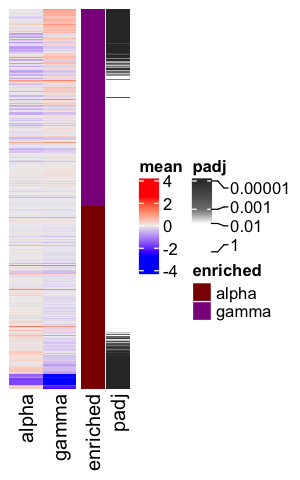

In [296]:
options(repr.plot.width = 2.5, repr.plot.height = 4)

ttest.res %>% head(1)
pd.rank <- ttest.res %>% filter(test == "alpha_vs_gamma") %>% ungroup
# pd.rank <- ttest.res %>% filter(test == 'beta_vs_delta')
require(ComplexHeatmap)
pvalue_col_fun = colorRamp2(c(0, 2, 3, 5), c("white", "grey100", "grey50", "grey20"))
ha = rowAnnotation(enriched = anno_simple(pd.rank %>% pull(enriched), col = c(alpha = "darkred", 
    gamma = "magenta4")), padj = anno_simple(-log10(pd.rank %>% pull(padj)), col = pvalue_col_fun))
ht = Heatmap(pd.rank %>% select(starts_with("mean")) %>% rename(alpha = mean_x, gamma = mean_y) %>% 
    as.matrix(), right_annotation = ha, cluster_rows = F, name = "mean", cluster_columns = F)
lgd_pvalue = Legend(title = "padj", col = pvalue_col_fun, at = c(0, 2, 3, 5), labels = c("1", 
    "0.01", "0.001", "0.00001"))
lgd_enriched = Legend(title = "enriched", legend_gp = gpar(fill = c("darkred", "magenta4")), 
    labels = c("alpha", "gamma"))

draw(ht, annotation_legend_list = list(lgd_pvalue, lgd_enriched))

In [18]:
require(circlize)
require(pals)

In [68]:
bks.tmp <- pd.rank.2 %>% select(diff) %>% mutate(diff = cut(diff, breaks = c(-1.2, -0.5, -0.25, 
    0, 0.25, 0.5, 1.2))) %>% table
names(bks.tmp)

[1] "(-1.2,-0.5]"  "(-0.5,-0.25]" "(-0.25,0]"    "(0,0.25]"     "(0.25,0.5]"  
[6] "(0.5,1.2]"

In [66]:
cols<- colorRampPalette(c('orange','green'))(6)


[1] "#FFA500" "#CCB700" "#99C900" "#65DB00" "#32ED00" "#00FF00"

,mean_beta,mean_delta,diff
1.1.2:Fos-related,0.7397806,1.825587,-1.085807


Warning message in strwidth(t, units = "in", cex = fontsize_row/fontsize):
“conversion failure on '2.3.1:Three-zinc finger Krüppel-related' in 'mbcsToSbcs': dot substituted for <cc>”Warning message in strwidth(t, units = "in", cex = fontsize_row/fontsize):
“conversion failure on '2.3.1:Three-zinc finger Krüppel-related' in 'mbcsToSbcs': dot substituted for <88>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on '2.3.1:Three-zinc finger Krüppel-related' in 'mbcsToSbcs': dot substituted for <cc>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on '2.3.1:Three-zinc finger Krüppel-related' in 'mbcsToSbcs': dot substituted for <88>”

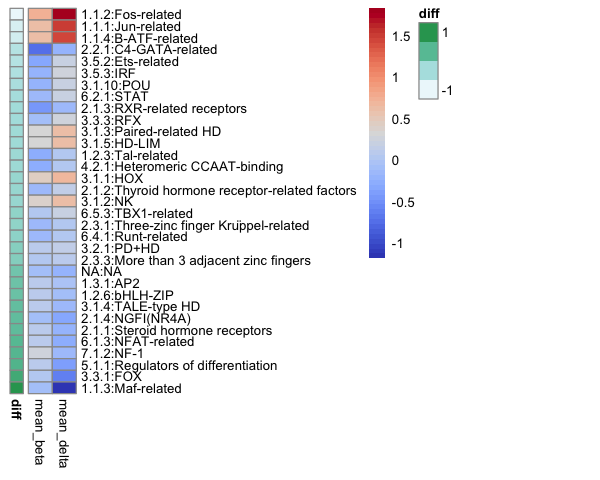

In [71]:
pd.rank.2 <- pd.rank %>% unite(family, family.id, family.name, sep = ":") %>% group_by(family) %>% 
    summarise(mean_beta = mean(mean_x), mean_delta = mean(mean_y)) %>% mutate(diff = mean_beta - 
    mean_delta) %>% drop_na %>% arrange(diff) %>% as.data.frame%>%column_to_rownames("family")
head(pd.rank.2, 1)
pheatmap(pd.rank.2 %>% select(-diff), annotation_row = pd.rank.2 %>% select(diff), color = coolwarm(51),
    scale = "none", cluster_cols = F, cluster_rows = F, fontsize = 8)

rank,motif,mean_x,mean_y,pval,test,x,y,enriched,FDR,padj,diff,id
1,MAFG,0.4259281,-2.01688,1.42e-74,alpha_vs_gamma,alpha,gamma,alpha,5.4812e-72,5.4812e-72,2.442808,MA0659.1


Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Three-zinc finger Krüppel-related' in 'mbcsToSbcs': dot substituted for <cc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Three-zinc finger Krüppel-related' in 'mbcsToSbcs': dot substituted for <88>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Three-zinc finger Krüppel-related' in 'mbcsToSbcs': dot substituted for <cc>”Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Three-zinc finger Krüppel-related' in 'mbcsToSbcs': dot substituted for <88>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on 'Three-zinc finger Krüppel-related' in 'mbcsToSbcs': dot substituted for <cc>”Warning message in grid.Call.graphics(C_text, as.graphicsAnnot(x$label), x$x,

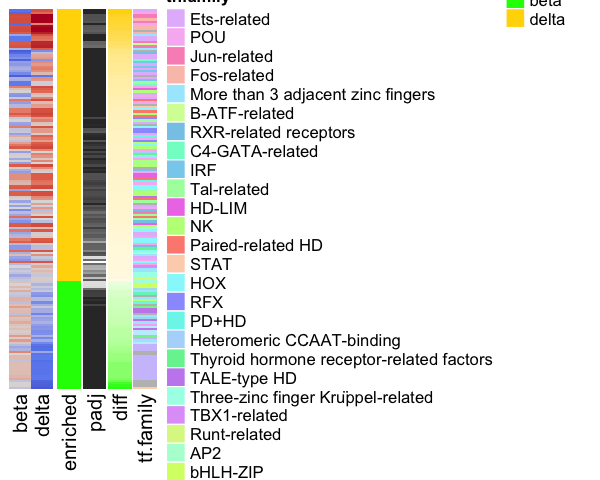

In [37]:
options(repr.plot.width = 5, repr.plot.height = 4)

ttest.res %>% head(1)
# pd.rank <- ttest.res %>% filter(test == 'alpha_vs_gamma') %>% ungroup
pd.rank <- ttest.res.2 %>% filter(test == "beta_vs_delta") %>% ungroup %>% arrange(diff) %>% 
    filter(padj < 0.01)
require(ComplexHeatmap)
pvalue_col_fun = colorRamp2(c(0, 2, 3, 10), c("white", "grey100", "grey50", "grey20"))
cls <- coolwarm(7)

main_col_fun = colorRamp2(c(-2, -0.5, 0, 0.5, 2), c(cls[1:2], cls[4], cls[6:7]))
ha = rowAnnotation(enriched = anno_simple(pd.rank %>% pull(enriched), col = c(beta = "green", 
    delta = "gold")), padj = anno_simple(-log10(pd.rank %>% pull(padj)), col = pvalue_col_fun), 
    diff = anno_simple(pd.rank$diff, col = colorRamp2(c(-1.3, 0, 1.1), c("gold", 
        "white", "green"))))
ht = Heatmap(col = main_col_fun, pd.rank %>% select(starts_with("mean")) %>% rename(beta = mean_x, 
    delta = mean_y) %>% as.matrix(), right_annotation = ha, cluster_rows = F, name = "mean", 
    cluster_columns = F)
lgd_pvalue = Legend(title = "padj", col = pvalue_col_fun, at = c(0, 2, 3, 50), labels = c("1", 
    "0.01", "0.001", "1e-50"))
lgd_enriched = Legend(title = "enriched", legend_gp = gpar(fill = c("green", "gold")), 
    labels = c("beta", "delta"))

draw(ht, annotation_legend_list = list(lgd_pvalue, lgd_enriched))

In [353]:
pd.rank%>%head(20)%>%mutate(rank=motif.1)%>%select(rank,motif)

rank,motif
1,NRL
2,MAFF
3,MAFK
4,MAFG
5,FOXP2
6,FOXG1
7,FOXP1
8,FOXI1
9,FOXL1
10,FOXD2


rank,motif,mean_x,mean_y,pval,test,x,y,enriched,FDR,padj,diff
187,NRL,-0.09615801,-1.187419,2.32e-89,beta_vs_delta,beta,delta,beta,8.9552e-87,8.9552e-87,1.091261


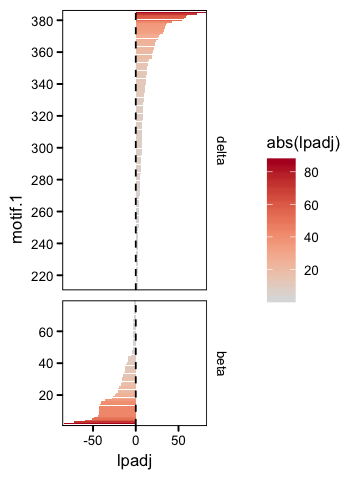

In [350]:
options(repr.plot.width = 3, repr.plot.height = 4)
require(pals) 

pd.rank <- ttest.res %>% filter(test == "beta_vs_delta") %>% ungroup

head(pd.rank, 1)
n_m =nrow(pd.rank %>% filter(enriched == 'delta'))
n_m =0
pd.rank <- pd.rank %>% mutate(motif.1 = as.numeric(factor(motif, levels = pd.rank$motif))-n_m, 
    lpadj = ifelse(enriched == "beta", log10(FDR), -log10(FDR))) %>% filter(FDR < 
    0.01) %>% mutate(enriched = factor(enriched, levels = c("delta", "beta")))
ggplot(pd.rank) + geom_bar(aes(motif.1, lpadj, fill = abs(lpadj)), stat = "identity") + 
    theme_pubr(base_size = 10) + theme() + coord_flip(expand = F) + scale_fill_gradientn(colours = pal.compress(coolwarm)[7:13]) + 
    scale_x_continuous(breaks = seq(0-n_m, 386-n_m, 20)) + facet_grid(enriched ~ ., scales = "free_y", 
    space = "free_y")+geom_hline(yintercept = 0,linetype=2)
# geom_vline(xintercept =  %>%
# pull(rank))) +
ggsave("~/Dropbox (UCSD_Epigenomics)/workReports/2019-09_islet_rev/Fig.1.b_d.rank.pdf",
    width = 3, height = 4, units = "in")

rank,motif,mean_x,mean_y,pval,test,x,y,enriched,FDR,padj,diff
1,MAFG,0.4259281,-2.01688,1.42e-74,alpha_vs_gamma,alpha,gamma,alpha,5.4812e-72,5.4812e-72,2.442808


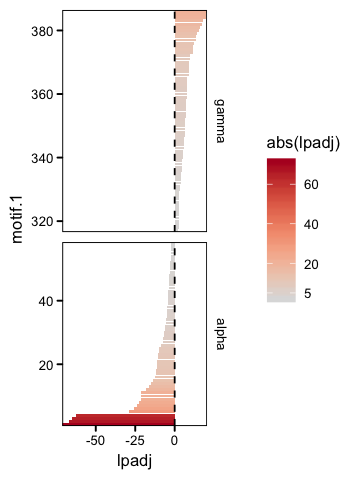

In [347]:
options(repr.plot.width = 3, repr.plot.height = 4)
require(pals)

pd.rank <- ttest.res %>% filter(test == "alpha_vs_gamma") %>% ungroup

head(pd.rank, 1)
n_m = nrow(pd.rank %>% filter(enriched == "gamma"))
n_m = 0
pd.rank <- pd.rank %>% mutate(motif.1 = as.numeric(factor(motif, levels = pd.rank$motif)) - 
    n_m, lpadj = ifelse(enriched == "alpha", log10(padj), -log10(padj))) %>% filter(padj < 
    0.01) %>% mutate(enriched = factor(enriched, levels = c("gamma", "alpha")))
ggplot(pd.rank) + geom_bar(aes(motif.1, lpadj, fill = abs(lpadj)), stat = "identity") + 
    theme_pubr(base_size = 10) + theme() + coord_flip(expand = F) + scale_fill_gradientn(colours = pal.compress(coolwarm)[7:13], 
    breaks = c(0, 2, 5, 20, 40, 60, 80)) + scale_x_continuous(breaks = seq(0 - 
    n_m, 386 - n_m, 20)) + facet_grid(enriched ~ ., scales = "free_y", space = "free_y") + 
    geom_hline(yintercept = 0, linetype = 2)
# geom_vline(xintercept = %>% pull(rank))) +
ggsave("~/Dropbox (UCSD_Epigenomics)/workReports/2019-09_islet_rev/Fig.1.a_g.rank.pdf", 
    width = 3, height = 4, units = "in")

### plots


In [9]:
cols.subtypes=c(alpha1='darkred',alpha2='lightpink',
               beta1='darkgreen',beta2='lightgreen',
               gamma1='orange',gamma2='gold')

In [10]:
cols.celltype["beta"] = rgb(t((col2rgb(cols.celltype["beta_1"]) + col2rgb(cols.celltype["beta_2"]))/2), 
    maxColorValue = 255)
cols.celltype["alpha"] = rgb(t((col2rgb(cols.celltype["alpha_1"]) + col2rgb(cols.celltype["alpha_2"]))/2), 
    maxColorValue = 255)
cols.celltype["delta"] = rgb(t((col2rgb(cols.celltype["delta_1"]) + col2rgb(cols.celltype["delta_2"]))/2), 
    maxColorValue = 255)

In [11]:
options(repr.plot.width = 3, repr.plot.height = 2)

m <- "NFIL3"
celltype.test <- c("alpha", "gamma")
plotViolin <- function(motif = m, test_celltypes = celltype.test) {
    pd <- input.chromVar.jaspar.z.agg %>% filter(name == motif, cell_type_overall %in% 
        test_celltypes)
    ggviolin(pd, x = "cell_type_overall", remove = T, width = 0.5, y = "zval", size = 0.5, 
        shape = 16, draw_quantiles = c(0.25, 0.5, 0.75), fill = "cell_type_overall", 
        ylab = "Motif enrichment") + theme_pubr() + ggtitle(motif) + geom_hline(yintercept = 0, 
        linetype = 2, size = 0.25) + theme(legend.position = "none", axis.text.x = element_text(angle = 45, 
        hjust = 1), axis.title.x = element_blank())
    
}


options(repr.plot.width = 1.5, repr.plot.height = 2)

plotViolin("SCRT1", c("beta", "delta"))

ERROR: Error in eval(lhs, parent, parent): object 'input.chromVar.jaspar.z.agg' not found


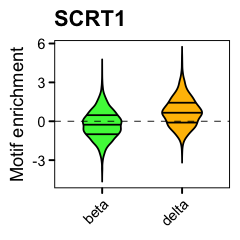

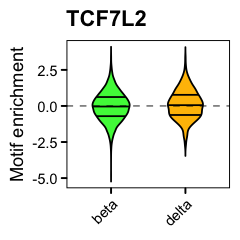

In [346]:
plotViolin("SCRT1", c("beta", "delta")) + scale_fill_manual(values = c(beta = cols.celltype$beta, 
    delta = cols.celltype$delta))
plotViolin("TCF7L2", c("beta", "delta")) + scale_fill_manual(values = c(beta = cols.celltype$beta, 
    delta = cols.celltype$delta))

In [253]:
ttest.res%>%filter(motif %in% c("TCF7L2"))

rank,motif,mean_x,mean_y,pval,test,x,y,enriched,FDR,padj
85,TCF7L2,-0.03064506,0.09302175,8.07058e-04,beta_vs_delta,beta,delta,delta,1.469455e-03,3.115244e-01
204,TCF7L2,-0.01133480,0.48557587,1.91000e-12,alpha_vs_gamma,alpha,gamma,gamma,1.714558e-11,7.372600e-10


In [145]:
options(repr.plot.width = 4, repr.plot.height = 4)
p1<- plotMotif(m="MAFG", "alpha_vs_gamma",size=1,bks=c(-3,0,3))
p2<-plotMotif(m="MEIS1", "alpha_vs_gamma",size=1,bks=c(-3,0,3))
#plotMotif(m="ELF5", "alpha_vs_gamma",size=1,bks=c(-2,0,2))
plotMotif(m="EHF", "alpha_vs_gamma",size=1,bks=c(-2,0,2))

ERROR: Error in plotMotif(m = "MAFG", "alpha_vs_gamma", size = 1, bks = c(-3, : could not find function "plotMotif"


Joining, by = "barcodes"


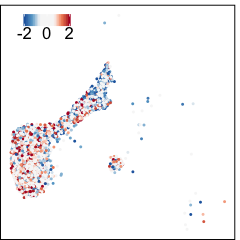

In [356]:
options(repr.plot.width = 2, repr.plot.height = 2)

plotMotif(m="FOXP2", "alpha_vs_gamma",size=.5, cls = rev(vals),bks=c(-2,0,2))

Joining, by = "barcodes"


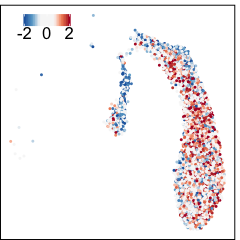

In [355]:
options(repr.plot.width = 2, repr.plot.height = 2)

plotMotif(m="FOXP2", "beta_vs_delta",size=.5, cls = rev(vals),bks=c(-2,0,2))

Joining, by = "barcodes"


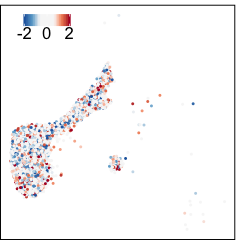

In [345]:

plotMotif(m="TCF7L2", "alpha_vs_gamma",size=.5, cls = rev(vals),bks=c(-2,0,2))

Joining, by = "barcodes"


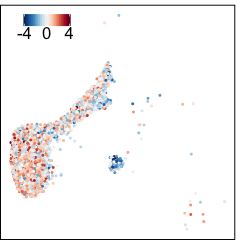

In [159]:
options(repr.plot.width = 2, repr.plot.height = 2)
plotMotif <- function(m = "SCRT1", cmp = "alpha_vs_gamma",...) {
    
    p <- fun.plot.project.motif(motif = m,...)
    p %+% (p$data %>% filter(cell_type_overall %in% unlist(strsplit(cmp, split = "_vs_"))))
    
}
plotMotif(m="MAFK", "alpha_vs_gamma",size=.5)

In [339]:
pd.rank%>%filter(grepl('TCF',motif))

rank,motif,mean_x,mean_y,pval,test,x,y,enriched,FDR,padj,diff,motif.1,lpadj
105,CTCF,-0.43046074,-0.29270361,0.004158581,beta_vs_delta,beta,delta,delta,0.0065787388,1.0000000,-0.1377571,219,2.181857
85,TCF7L2,-0.03064506,0.09302175,0.000807058,beta_vs_delta,beta,delta,delta,0.0014694547,0.3115244,-0.1236668,239,2.832844
78,TCF3,0.01189289,0.16372772,0.000492461,beta_vs_delta,beta,delta,delta,0.0009364037,0.1900899,-0.1518348,246,3.028537


Joining, by = "barcodes"


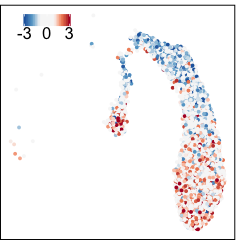

In [340]:
options(repr.plot.width = 2, repr.plot.height = 2)

p <- plotMotif("TCF3", "beta_vs_delta", size = 0.75, bks = c(-3, 0, 3), cls = rev(vals))
p

Joining, by = "barcodes"
Joining, by = "barcodes"


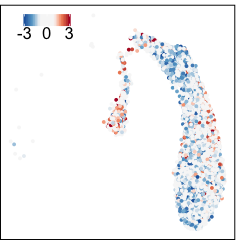

Joining, by = "barcodes"


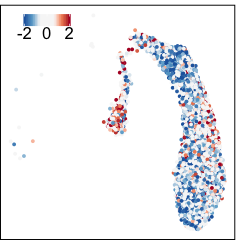

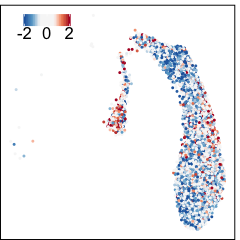

In [329]:
vals <- brewer_pal(palette = "RdBu")(7)
vals[3:5] <- vals[4]
options(repr.plot.width = 2, repr.plot.height = 2)

p <- plotMotif("EHF", "beta_vs_delta", size = 0.75, bks = c(-3, 0, 3), cls = rev(vals))
p
p <- plotMotif("EHF", "beta_vs_delta", size = 0.75, bks = c(-2, 0, 2), cls = rev(vals))
p
p <- plotMotif("EHF", "beta_vs_delta", size = 0.5, bks = c(-2, 0, 2), cls = rev(vals))
p

Joining, by = "barcodes"


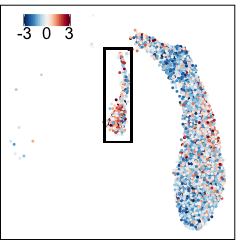

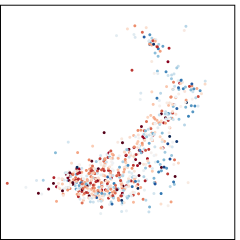

In [255]:
options(repr.plot.width = 2, repr.plot.height = 2)

p <- plotMotif("EHF", "beta_vs_delta", size = 0.5, bks = c(-3, 0, 3))
xxmin = -1.3
xxmax = 1
yymin = -2.5
yymax = 1.5
p + geom_rect(xmin = xxmin, xmax = xxmax, ymin = yymin, ymax = yymax, fill = NA, 
    color = "black")
ggsave("~/Dropbox (UCSD_Epigenomics)/workReports/2019-09_islet_rev/Fig.1.ehf.b_d.umap.pdf", 
    width = 2, height = 2, units = "in")
p$data <- p$data %>% filter(cell_type_overall == "delta")
p + coord_cartesian(ylim = c(yymin, yymax), xlim = c(xxmin, xxmax)) + theme(legend.position = "none")
ggsave("~/Dropbox (UCSD_Epigenomics)/workReports/2019-09_islet_rev/Fig.1.ehf.b_d.umap.insert.pdf", 
    width = 1, height = 1, units = "in")

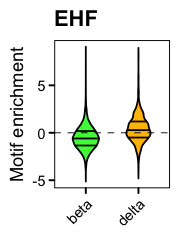

In [247]:
options(repr.plot.width = 1.5, repr.plot.height = 2)
plotViolin("EHF", c("beta", "delta")) + scale_fill_manual(values = c(beta = cols.celltype$beta, 
    delta = cols.celltype$delta))
ggsave("~/Dropbox (UCSD_Epigenomics)/workReports/2019-09_islet_rev/Fig.1.ehf.b_d.umap.insert.violin.pdf", 
    width = 1.5, height = 2, units = "in")

Joining, by = "barcodes"


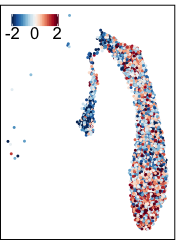

In [250]:
plotMotif("MAFF", "beta_vs_delta", size = 0.5, bks = c(-2, 0, 2))
ggsave("~/Dropbox (UCSD_Epigenomics)/workReports/2019-09_islet_rev/Fig.1.maff.b_d.umap.pdf", 
    width = 2, height = 2, units = "in",useDingbats=F)


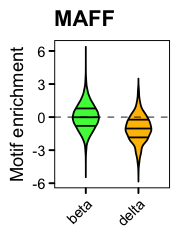

In [249]:
options(repr.plot.width = 1.5, repr.plot.height = 2)
plotViolin("MAFF", c("beta", "delta")) + scale_fill_manual(values = c(beta = cols.celltype$beta, 
    delta = cols.celltype$delta))
ggsave("~/Dropbox (UCSD_Epigenomics)/workReports/2019-09_islet_rev/Fig.1.maff.b_d.umap.insert.violin.pdf", 
    width = 1.5, height = 2, units = "in")

Joining, by = "barcodes"


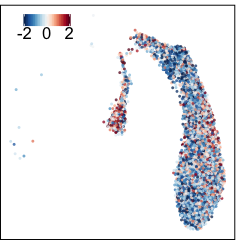

Joining, by = "barcodes"


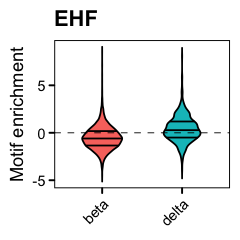

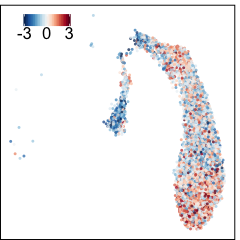

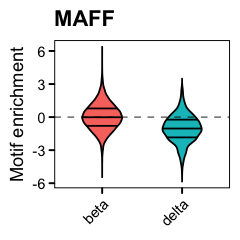

In [208]:
#options(repr.plot.width = 6, repr.plot.height = 6)

p<- plotMotif("EHF", "beta_vs_delta",size=.5,bks=c(-2,0,2),alpha=.75)
p
plotViolin("EHF", c("beta", "delta"))

plotMotif("MAFF", "beta_vs_delta",size=.5,bks=c(-3,0,3),alpha=.75)
plotViolin("MAFF", c("beta", "delta"))

Joining, by = "barcodes"


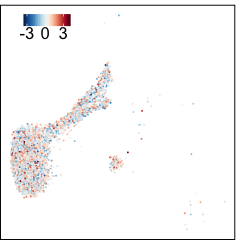

In [341]:
options(repr.plot.width = 2, repr.plot.height = 2)

plotMotif("EGR", "alpha_vs_gamma")

Joining, by = "barcodes"


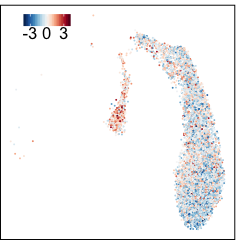

In [339]:
options(repr.plot.width = 2, repr.plot.height = 2)

plotMotif("EHF", "beta_vs_delta")

In [334]:
options(repr.plot.width = 5, repr.plot.height = 4, max_z = 3)
plotSNmotif <- function(testt = "alpha_vs_gamma", fdr_th = 0.001) {
    top_motifs <- ttest.res %>% filter(padj < fdr_th & test == testt) %>% pull(motif)
    
    cell_types <- unlist(strsplit(testt, "_vs_"))
    pd <- input.chromVar.jaspar.z.agg %>% filter(name %in% top_motifs & cell_type_overall %in% 
        cell_types) %>% select(barcodes, name, zval, cell_type_overall) %>% mutate(motif = as.numeric(factor(name, 
        levels = top_motifs)))
    dim(pd)
    pd$zval[pd$zval > max_z] <- max_z
    pd$zval[pd$zval < -max_z] <- -max_z
    
    tmp <- pd %>% select(barcodes, cell_type_overall) %>% unique() %>% arrange(cell_type_overall)
    # dim(tmp %>% mutate(barcodes))
    
    pd <- pd %>% mutate(barcodes = as.numeric(factor(barcodes, levels = tmp$barcodes)))
    
    print(seps <- table(tmp %>% unique() %>% pull(cell_type_overall)))
    
    print(seps.motif <- table(ttest.res %>% filter(padj < fdr_th & test == testt) %>% 
        pull(enriched)))
    
    ncolor = 5
    ggplot(pd, aes(x = barcodes, y = motif)) + geom_raster(aes(fill = zval)) + geom_hline(yintercept = as.numeric(cumsum(seps.motif))[1], 
        linetype = 2, size = 0.5) + geom_vline(xintercept = as.numeric(cumsum(seps))[1], 
        linetype = 2, size = 0.5) + coord_cartesian(expand = F) + theme_bw() + theme(panel.grid = element_blank()) + 
        scale_fill_gradientn(colors = colorRampPalette(c("blue", "white", "red"))(ncolor), 
            breaks = seq(-3, 3, length.out = ncolor))
}


alpha gamma 
 5535   205 

alpha gamma 
   58    70 


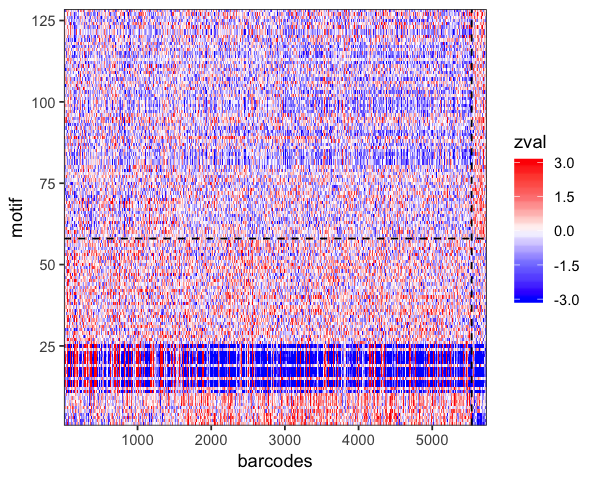

In [337]:
plotSNmotif(testt = 'alpha_vs_gamma',fdr_th = .01)

In [377]:
p <- plotSNmotif(testt = "alpha_vs_gamma", fdr_th = 0.01)



alpha gamma 
 5535   205 

alpha gamma 
   58    70 


In [400]:
quantileNorm <- function(dat.vect,lowq = 0.05) {
    dat <- as.numeric(dat.vect)
    lowq = 0.05
    (qs <- as.numeric(quantile(dat, c(lowq, 1 - lowq))))
    dat <- (dat - qs[1])/(qs[2] - qs[1])
    dat[dat > 1] <- 1
    dat[dat < 0] <- 0
    dat
}


In [424]:
require(pals)


 beta delta 
 7109   709 

 beta delta 
   45   108 


Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.


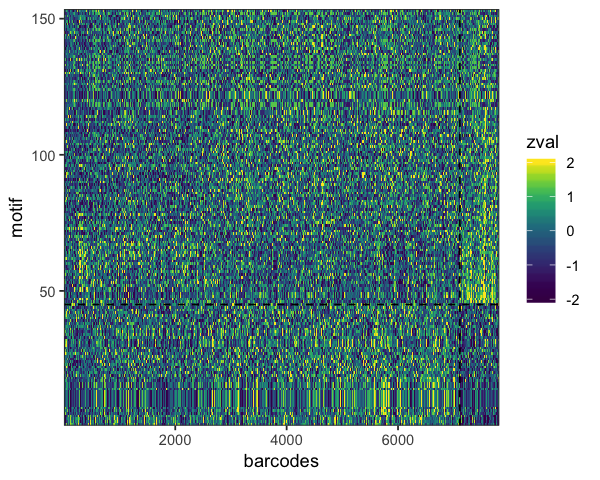

In [441]:
p <- plotSNmotif(testt = "beta_vs_delta", fdr_th = 0.001)
p$data <- p$data %>% group_by(motif) %>% mutate(zval = scale(zval, center = T))
p$data$zval[p$data$zval > 2] <- 2
p$data$zval[p$data$zval < -2] <- -2
print(p + scale_fill_gradientn(colours = colorRampPalette((viridis(30)), bias = .75)(30)))


alpha gamma 
 5535   205 

alpha gamma 
   58    70 


Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.


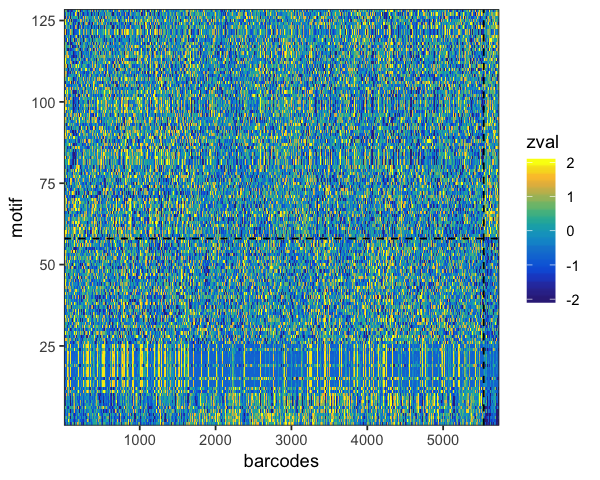

In [429]:
p <- plotSNmotif(testt = "alpha_vs_gamma", fdr_th = 0.01)
p$data <- p$data %>% group_by(motif) %>% mutate(zval = scale(zval, center = T))
p$data$zval[p$data$zval > 2] <- 2
p$data$zval[p$data$zval < -2] <- -2
print(p + scale_fill_gradientn(colours = colorRampPalette(parula(30),bias=.75)(30)))


alpha gamma 
 5535   205 

alpha gamma 
   58    70 


Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.


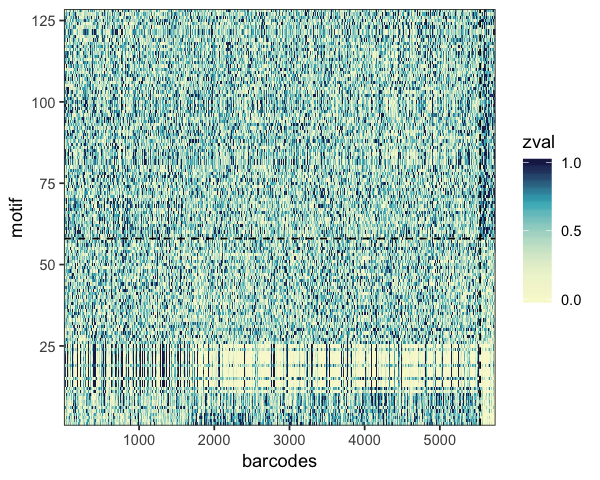

In [406]:
options(repr.plot.width = 5, repr.plot.height = 4)
p <- plotSNmotif(testt = "alpha_vs_gamma", fdr_th = 0.01)
p$data <- p$data %>% group_by(motif) %>% mutate(zval = quantileNorm(dat.vect = zval))
print(p + scale_fill_gradientn(colours = colorRampPalette(cols.hm.avg.tf(30), bias = 0.5)(30), 
    breaks = seq(0, 1, length.out = 3)))


alpha gamma 
 5535   205 

alpha gamma 
   58    70 


barcodes,name,zval,cell_type_overall,motif
1,EHF,0.9106399,alpha,67


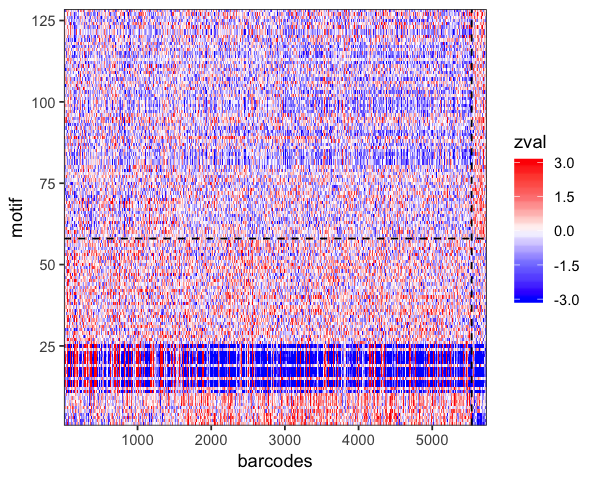

In [348]:
options(repr.plot.width = 5, repr.plot.height = 4, max_z = 3)
p<- plotSNmotif(testt = 'alpha_vs_gamma',fdr_th = .01)
print(p)



 beta delta 
 7109   709 

 beta delta 
   45   108 


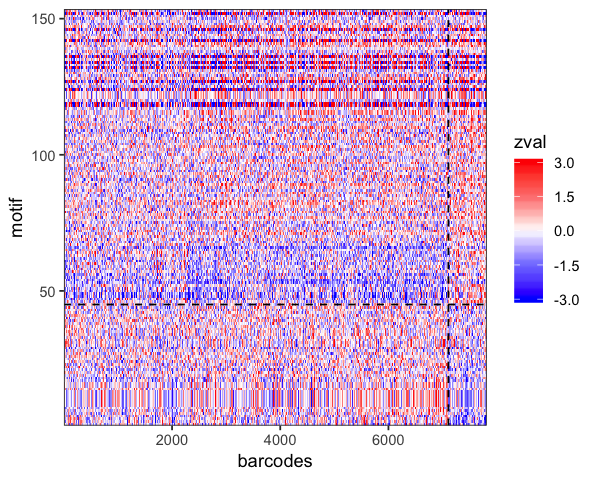

In [335]:
plotSNmotif(testt = 'beta_vs_delta')